In [96]:
import pandas as pd
import numpy as np
import json
from pathlib import Path
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.inspection import permutation_importance
from sklearn.utils import resample
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns
from interpret import show
import lime
import lime.lime_tabular
import shap
import warnings
warnings.filterwarnings('ignore')

import sys
sys.path.append('../src') 

from data_pipeline.extractor import execute_query
from gams.logistic_gam import train_logistic_gam_model
from gams.ebm_gam import train_ebm_model, display_global_explanation_with_full_feature_names
from ml_models.random_forest import train_random_forest_model
from ml_models.evalauion_results import evaluate_model
from ml_models.xgb_model import train_xgboost_model

In [97]:
query = """
SELECT s.*, a.hospital_expire_flag as mortality
FROM apsiii s
LEFT JOIN admissions a
ON s.subject_id = a.subject_id
AND s.hadm_id = a.hadm_id;
"""

df = execute_query(query)

# 1. APSIII Traditional Scoring Model

In [98]:
df_apsiii = df.copy()
df_apsiii['apsiii_binary'] = (df_apsiii['apsiii_prob'] >= 0.5).astype(int)

# Exclude specific columns
df_apsiii_filtered = df_apsiii.drop(columns=['subject_id', 'hadm_id', 'icustay_id', 'apsiii'])

# Replace NaNs with 0
df_apsiii_filtered = df_apsiii_filtered.fillna(0)

# Separate features and target variable
y_true = df_apsiii_filtered['mortality']

apsiii_pred_on_X = df_apsiii_filtered[["apsiii_binary","apsiii_prob"]]


# Split the balanced data into training and test sets
X_train_apsiii_pred, X_test_apsiii_pred, y_train, y_test = train_test_split(apsiii_pred_on_X, y_true, test_size=0.2, random_state=42, stratify=y_true)

# Print class distribution after the split
print("Training set class distribution:")
print(y_train.value_counts())

print("Test set class distribution:")
print(y_test.value_counts())

Training set class distribution:
mortality
0    43938
1     5287
Name: count, dtype: int64
Test set class distribution:
mortality
0    10985
1     1322
Name: count, dtype: int64


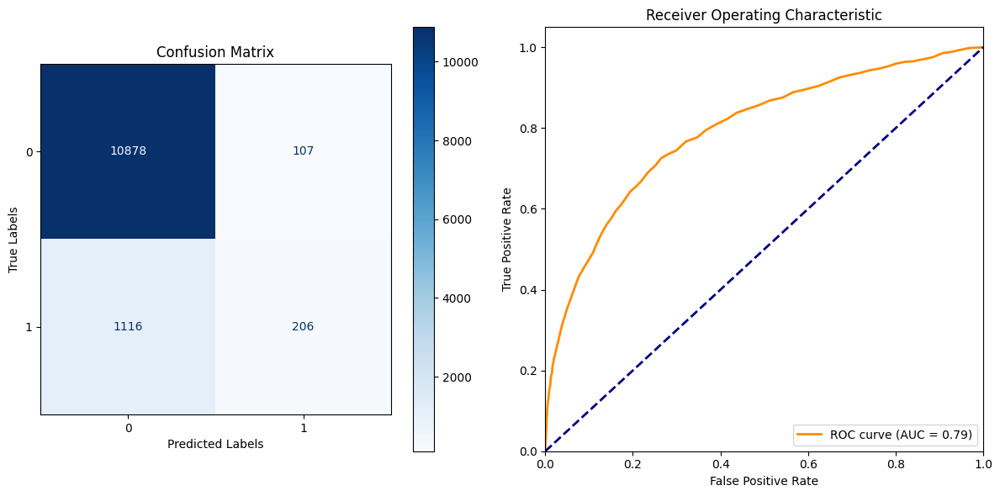

apsiii Traditional Scoring Model:

ROC AUC Score: 0.7931
Precision-Recall AUC Score: 0.4008
Training Accuracy: 0.8992
Test Accuracy: 0.9006
F1 Score: 0.2520

Confusion Matrix:
[[10878   107]
 [ 1116   206]]
Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.99      0.95     10985
           1       0.66      0.16      0.25      1322

    accuracy                           0.90     12307
   macro avg       0.78      0.57      0.60     12307
weighted avg       0.88      0.90      0.87     12307



In [99]:
y_pred_apsiii = X_test_apsiii_pred['apsiii_binary']
y_pred_prob_apsiii = X_test_apsiii_pred['apsiii_prob']

evaluation_results_apsiii = evaluate_model(y_test, y_pred_apsiii, y_pred_prob_apsiii)

# Print the ROC AUC and Precision-Recall AUC Scores
print("apsiii Traditional Scoring Model:\n")
print(f"ROC AUC Score: {evaluation_results_apsiii['roc_auc']:.4f}")
print(f"Precision-Recall AUC Score: {evaluation_results_apsiii['roc_prc']:.4f}")
print(f"Training Accuracy: {accuracy_score(y_train,X_train_apsiii_pred['apsiii_binary']):.4f}")
print(f"Test Accuracy: {evaluation_results_apsiii['test_accuracy']:.4f}")
print(f"F1 Score: {evaluation_results_apsiii['f1_score']:.4f}")

# Print the Confusion Matrix
print("\nConfusion Matrix:")
print(evaluation_results_apsiii['confusion_matrix'])

report_apsiii = evaluation_results_apsiii['classification_report']
print("Classification Report:\n", report_apsiii)

# Train-Test Split and Standardization

In [100]:
df_models = df.copy()

# Exclude specific columns
df_filtered = df_models.drop(columns=['subject_id', 'hadm_id', 'icustay_id', 'apsiii', 'apsiii_prob'])

# Replace NaNs with 0
df_filtered = df_filtered.fillna(0)

# Separate features and target variable
y = df_filtered['mortality']
X = df_filtered.drop(columns=['mortality'])

# Split the balanced data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Print class distribution after the split
print("Training set class distribution:")
print(y_train.value_counts())

print("Test set class distribution:")
print(y_test.value_counts())

# Standardize the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

Training set class distribution:
mortality
0    43938
1     5287
Name: count, dtype: int64
Test set class distribution:
mortality
0    10985
1     1322
Name: count, dtype: int64


# 2. LogisticGam Model

In [101]:
# Save the best configurations to a JSON file
config_file_path = Path("../hyperparameter_tuning_optuna/logisticgam_apsiii_best_configs.json")

# Load the saved configuration (if it exists)
if config_file_path.exists():
    with open(config_file_path, "r") as config_file:
        best_configs = json.load(config_file)

best_params = best_configs["best_params"]

terms_option = best_params["terms_option"]
max_iter = best_params["max_iter"]
tol = best_params["tol"]
fit_intercept = best_params["fit_intercept"]

print(json.dumps(best_params, indent=4))

{
    "terms_option": "auto",
    "max_iter": 100,
    "tol": 0.0001,
    "fit_intercept": true
}


LogisticGAM                                                                                               
=============================================== ==========================================================
Distribution:                      BinomialDist Effective DoF:                                     81.3051
Link Function:                        LogitLink Log Likelihood:                                -12796.6798
Number of Samples:                        49225 AIC:                                            25755.9698
                                                AICc:                                           25756.2489
                                                UBRE:                                               2.5246
                                                Scale:                                                 1.0
                                                Pseudo R-Squared:                                   0.2378
Feature Function                  Lam

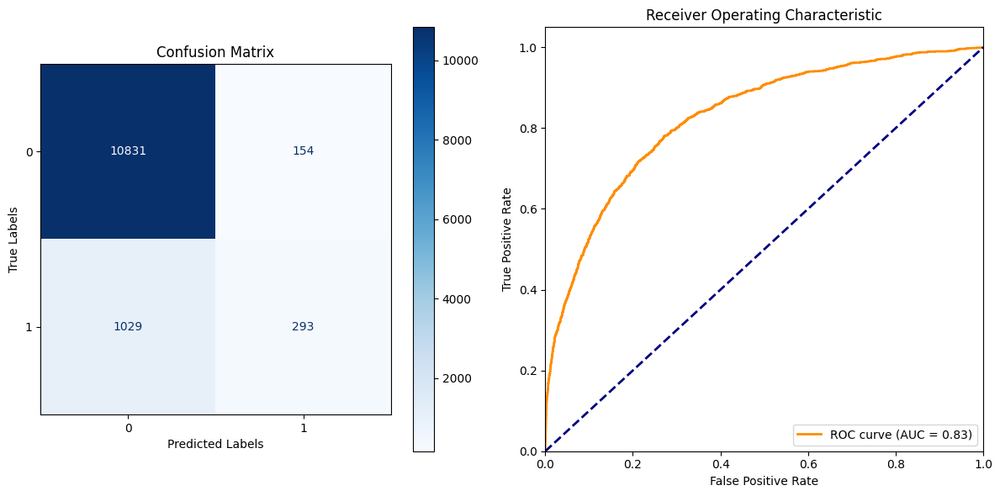

LogisticGAM Model:

ROC AUC Score: 0.8277
Precision-Recall AUC Score: 0.4558
Training Accuracy: 0.9041
Test Accuracy: 0.9039
F1 Score: 0.3313

Confusion Matrix:
[[10831   154]
 [ 1029   293]]
Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.99      0.95     10985
           1       0.66      0.22      0.33      1322

    accuracy                           0.90     12307
   macro avg       0.78      0.60      0.64     12307
weighted avg       0.89      0.90      0.88     12307



In [102]:
model_lr, results_lr = train_logistic_gam_model(X_train_scaled, y_train, X_test_scaled, terms=terms_option, 
                                                max_iter=max_iter, tol=tol, fit_intercept=fit_intercept, include_summary=True)

evaluation_results_lr = evaluate_model(y_test, results_lr['y_pred'], results_lr['y_pred_prob'])

# Print the ROC AUC and Precision-Recall AUC Scores
print("LogisticGAM Model:\n")
print(f"ROC AUC Score: {evaluation_results_lr['roc_auc']:.4f}")
print(f"Precision-Recall AUC Score: {evaluation_results_lr['roc_prc']:.4f}")
print(f"Training Accuracy: {results_lr['training_accuracy']:.4f}")
print(f"Test Accuracy: {evaluation_results_lr['test_accuracy']:.4f}")
print(f"F1 Score: {evaluation_results_lr['f1_score']:.4f}")


# Print the Confusion Matrix
print("\nConfusion Matrix:")
print(evaluation_results_lr['confusion_matrix'])

report_lr = evaluation_results_lr['classification_report']
print("Classification Report:\n", report_lr)

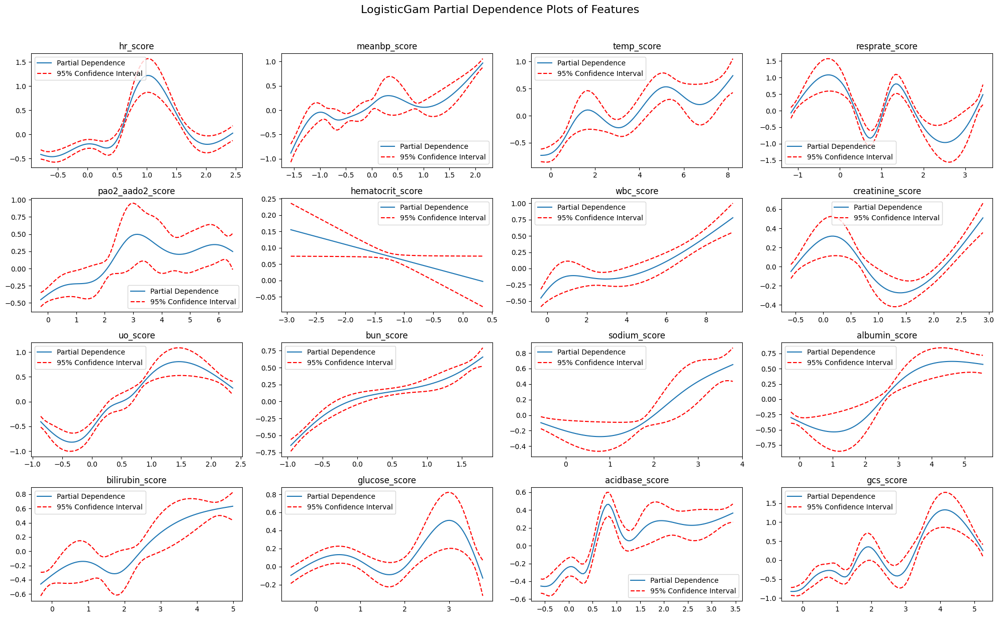

In [103]:
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(20, 12))  # Adjust figsize as needed
axes = axes.flatten()  # Flatten the axes array for easier indexing

# Loop over the terms and plot
for i, term in enumerate(model_lr.terms):
    if term.isintercept:
        continue

    # Generate data for plotting
    XX = model_lr.generate_X_grid(term=i)
    pdep, confi = model_lr.partial_dependence(term=i, X=XX, width=0.95)

    # Get the current axis to plot on
    ax = axes[i]
    ax.plot(XX[:, term.feature], pdep, label='Partial Dependence')
    ax.plot(XX[:, term.feature], confi, c='r', ls='--')

    ax.set_title(X.columns[i])

    ax.legend(['Partial Dependence', '95% Confidence Interval'])

# Set a main title for the entire figure
fig.suptitle('LogisticGam Partial Dependence Plots of Features', fontsize=16, y=1.02)

# Adjust layout to avoid overlapping titles and labels
plt.tight_layout()
plt.show()


# 3. EBM Model

In [104]:
# Save the best configurations to a JSON file
config_file_path = Path("../hyperparameter_tuning_optuna/ebm_apsiii_best_configs.json")

# Load the saved configuration (if it exists)
if config_file_path.exists():
    with open(config_file_path, "r") as config_file:
        best_configs = json.load(config_file)
else:
    raise FileNotFoundError(f"Configuration file not found at {config_file_path}")

# Extracting the best parameters
best_params = best_configs["best_params"]
 
print(json.dumps(best_params, indent=4))

{
    "max_bins": 471,
    "max_interaction_bins": 16,
    "interactions": 0,
    "outer_bags": 9,
    "inner_bags": 5,
    "learning_rate": 0.06484304370718583,
    "min_samples_leaf": 74,
    "max_leaves": 10,
    "max_rounds": 10933,
    "early_stopping_rounds": 83,
    "smoothing_rounds": 264,
    "greedy_ratio": 0.9967306517111342
}


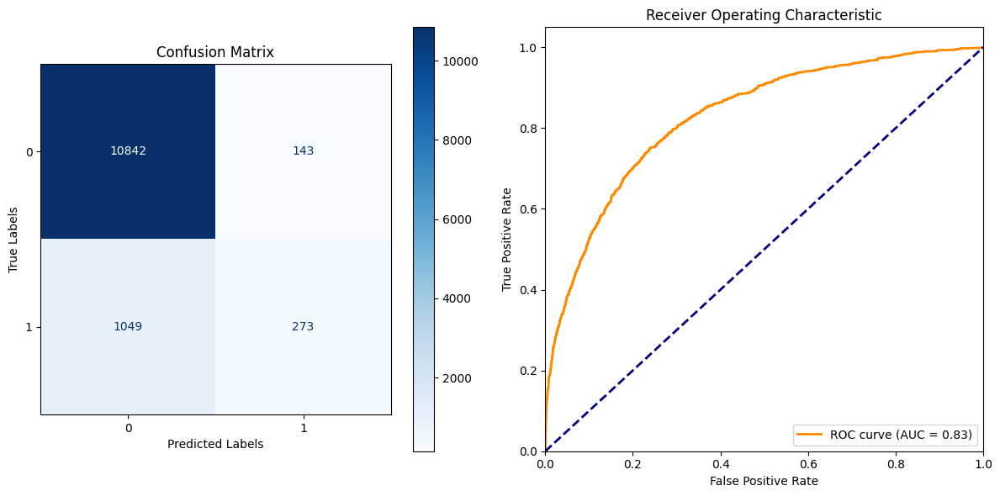

EBM Model: 

ROC AUC Score: 0.8288
Precision-Recall AUC Score: 0.4532
Training Accuracy: 0.9039
Test Accuracy: 0.9031
F1 Score: 0.3142

Confusion Matrix:
[[10842   143]
 [ 1049   273]]
Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.99      0.95     10985
           1       0.66      0.21      0.31      1322

    accuracy                           0.90     12307
   macro avg       0.78      0.60      0.63     12307
weighted avg       0.88      0.90      0.88     12307



In [105]:
model_ebm, results_ebm = train_ebm_model(X_train_scaled, y_train, X_test_scaled, **best_params)

evaluation_results_ebm = evaluate_model(y_test, results_ebm['y_pred'], results_ebm['y_pred_prob'])

print("EBM Model: \n")
print(f"ROC AUC Score: {evaluation_results_ebm['roc_auc']:.4f}")
print(f"Precision-Recall AUC Score: {evaluation_results_ebm['roc_prc']:.4f}")
print(f"Training Accuracy: {results_ebm['training_accuracy']:.4f}")
print(f"Test Accuracy: {evaluation_results_ebm['test_accuracy']:.4f}")
print(f"F1 Score: {evaluation_results_ebm['f1_score']:.4f}")

print("\nConfusion Matrix:")
print(evaluation_results_ebm['confusion_matrix'])

report_ebm = evaluation_results_ebm['classification_report']
print("Classification Report:\n", report_ebm)

In [106]:
display_global_explanation_with_full_feature_names(model_ebm, X.columns)

<!-- http://127.0.0.1:7665/2006850129264/ -->

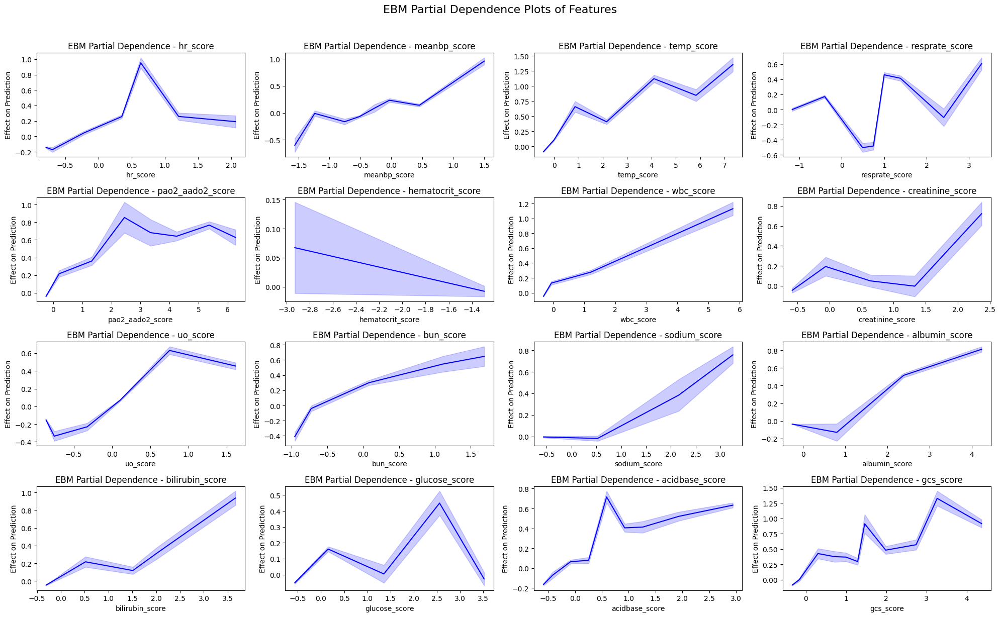

In [107]:
def plot_ebm_pdp(model_ebm, feature_to_plot, feature_names, ax):
    # Get the index of the feature to plot
    feature_idx = feature_names.index(feature_to_plot)
    
    # Obtain global explanation for the EBM model
    ebm_global = model_ebm.explain_global()
    
    # Extract data for the specified feature
    data = ebm_global.data(feature_idx)
    
    # Ensure the dimensions match for plotting
    plot_length = min(len(data['names']), len(data['scores']))
    
    # Plot the partial dependence plot for the specified feature on the given axis
    ax.plot(data['names'][:plot_length], data['scores'][:plot_length], color='blue', label='Partial Dependence')
    ax.fill_between(data['names'][:plot_length], data['lower_bounds'][:plot_length], data['upper_bounds'][:plot_length], color='blue', alpha=0.2, label='95% CI')
    
    # Set plot title and labels
    ax.set_title(f"EBM Partial Dependence - {feature_to_plot}")
    ax.set_xlabel(feature_to_plot)
    ax.set_ylabel("Effect on Prediction")

# Example Workflow
feature_names = X.columns.tolist()  # Assuming X is your original DataFrame with column names

fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(20, 12))  # Adjust figsize as needed
axes = axes.flatten()  # Flatten the axes array for easier indexing

# Loop through all features and plot on the corresponding axes
for i, feature in enumerate(feature_names):
    if i >= len(axes):
        break  # Avoid indexing issues if there are more features than subplot slots
    plot_ebm_pdp(model_ebm, feature, feature_names, axes[i])

# Set a main title for the entire figure
fig.suptitle('EBM Partial Dependence Plots of Features', fontsize=16, y=1.02)

# Adjust layout to avoid overlapping titles and labels
plt.tight_layout()
plt.show()

# 4. Random Forest Model

In [26]:
# Save the best configurations to a JSON file
config_file_path = Path("../hyperparameter_tuning_optuna/random_forest_apsiii_best_configs.json")

# Load the saved configuration (if it exists)
if config_file_path.exists():
    with open(config_file_path, "r") as config_file:
        best_configs = json.load(config_file)
else:
    raise FileNotFoundError(f"Configuration file not found at {config_file_path}")

# Extracting the best parameters
best_params = best_configs["best_params"]
 
print(json.dumps(best_params, indent=4))

{
    "n_estimators": 173,
    "criterion": "entropy",
    "max_depth": 22,
    "min_samples_split": 10,
    "min_samples_leaf": 4,
    "min_weight_fraction_leaf": 0.021718504190443414,
    "max_features": "log2",
    "max_leaf_nodes": 20,
    "min_impurity_decrease": 0.00020050960333953174,
    "bootstrap": false,
    "class_weight": "balanced_subsample",
    "ccp_alpha": 0.0010040314628222235
}


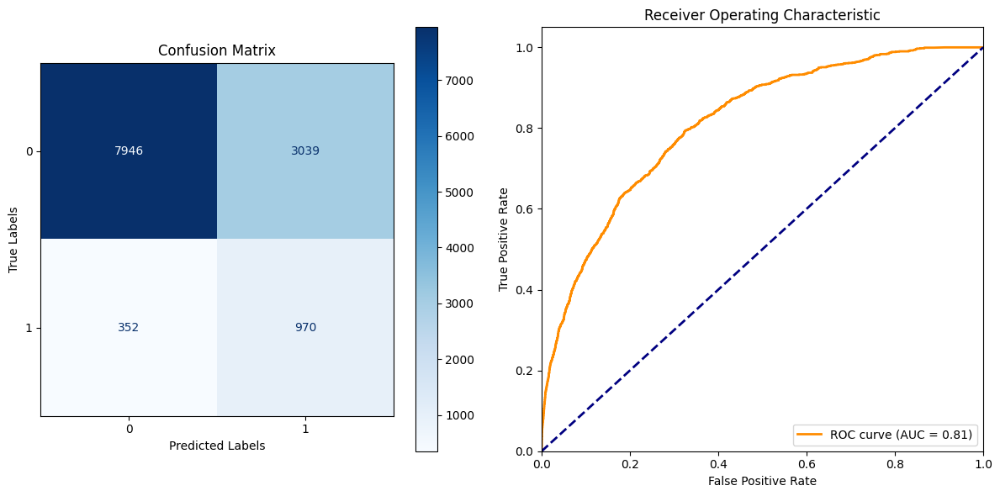

Random Forest Model: 

ROC AUC Score: 0.8114
Precision-Recall AUC Score: 0.3974
Training Accuracy: 0.7212
Test Accuracy: 0.7245
F1 Score: 0.3639

Confusion Matrix:
[[7946 3039]
 [ 352  970]]
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.72      0.82     10985
           1       0.24      0.73      0.36      1322

    accuracy                           0.72     12307
   macro avg       0.60      0.73      0.59     12307
weighted avg       0.88      0.72      0.77     12307



In [27]:
model_rf, results_rf = train_random_forest_model(X_train_scaled, y_train, X_test_scaled, **best_params)

evaluation_results_rf = evaluate_model(y_test, results_rf['y_pred'], results_rf['y_pred_prob'])

print("Random Forest Model: \n")
print(f"ROC AUC Score: {evaluation_results_rf['roc_auc']:.4f}")
print(f"Precision-Recall AUC Score: {evaluation_results_rf['roc_prc']:.4f}")
print(f"Training Accuracy: {results_rf['training_accuracy']:.4f}")
print(f"Test Accuracy: {evaluation_results_rf['test_accuracy']:.4f}")
print(f"F1 Score: {evaluation_results_rf['f1_score']:.4f}")

print("\nConfusion Matrix:")
print(evaluation_results_rf['confusion_matrix'])

report_rf = evaluation_results_rf['classification_report']
print("Classification Report:\n", report_rf)

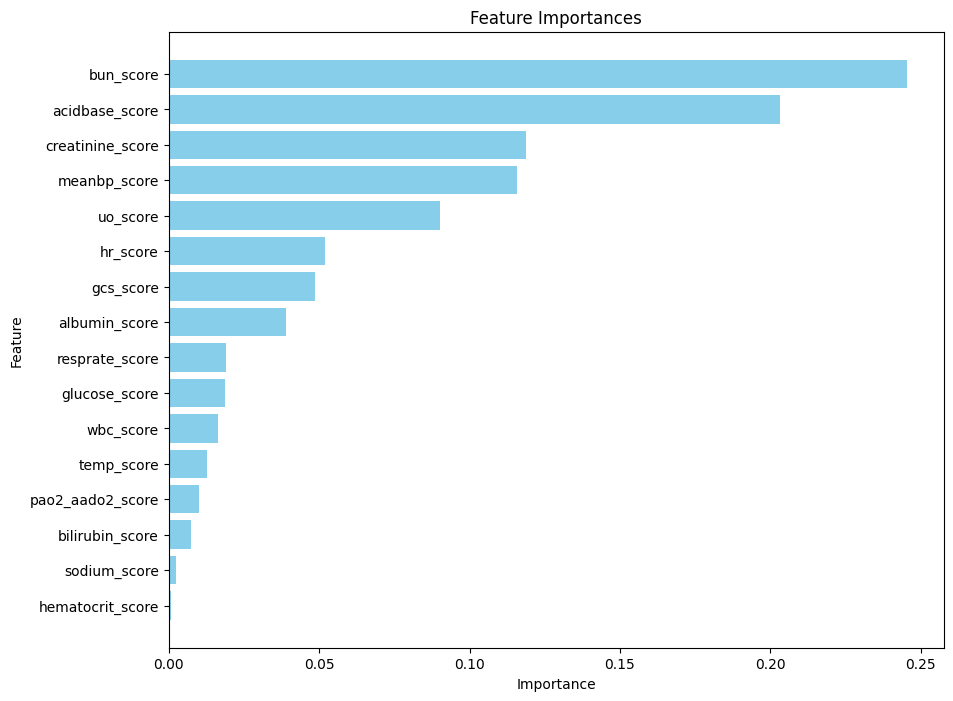

In [28]:
feature_importances_rf = model_rf.feature_importances_
feature_names_rf = X.columns
feature_importance_df_rf = pd.DataFrame({
    'Feature': feature_names_rf,
    'Importance': feature_importances_rf
})

feature_importance_df_rf = feature_importance_df_rf.sort_values(by='Importance', ascending=False)


plt.figure(figsize=(10, 8))
plt.barh(feature_importance_df_rf['Feature'], feature_importance_df_rf['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importances')
plt.gca().invert_yaxis() 
plt.show()

# 5. XGBoost Model

In [29]:
# File path to the JSON file with the best configurations
config_file_path = Path("../hyperparameter_tuning_optuna/xgboost_apsiii_best_configs.json")

# Load the saved configuration (if it exists)
if config_file_path.exists():
    with open(config_file_path, "r") as config_file:
        best_configs = json.load(config_file)
else:
    raise FileNotFoundError(f"Configuration file not found at {config_file_path}")

# Extracting the best parameters
best_params = best_configs["best_params"]
print(json.dumps(best_params, indent=4))

{
    "learning_rate": 0.03437114678262486,
    "max_depth": 6,
    "min_child_weight": 9.588464219127449,
    "subsample": 0.5465076961620297,
    "colsample_bytree": 0.6003002614899823,
    "reg_alpha": 8.579602514350436,
    "reg_lambda": 1.1803238056562555,
    "scale_pos_weight": 3.8307394260658176,
    "n_estimators": 460,
    "gamma": 1.8349690471934739,
    "max_delta_step": 9.944174595339588
}


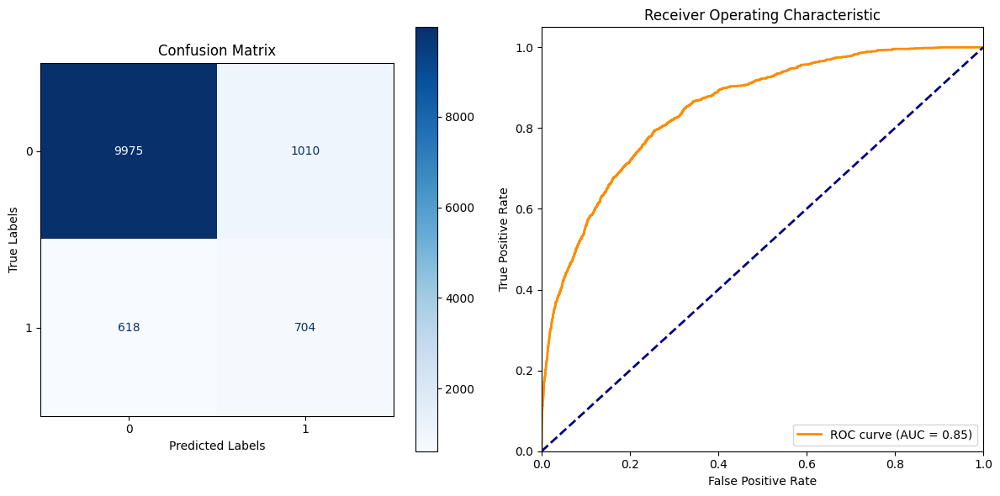

XGBoost Model: 

ROC AUC Score: 0.8489
Precision-Recall AUC Score: 0.4927
Training Accuracy: 0.8806
Test Accuracy: 0.8677
F1 Score: 0.4638

Confusion Matrix:
[[9975 1010]
 [ 618  704]]
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.91      0.92     10985
           1       0.41      0.53      0.46      1322

    accuracy                           0.87     12307
   macro avg       0.68      0.72      0.69     12307
weighted avg       0.88      0.87      0.88     12307



In [30]:
model_xgb, results_xgb = train_xgboost_model(X_train_scaled, y_train, X_test_scaled,**best_params)

evaluation_results_xgb = evaluate_model(y_test, results_xgb['y_pred'], results_xgb['y_pred_prob'])

print("XGBoost Model: \n")
print(f"ROC AUC Score: {evaluation_results_xgb['roc_auc']:.4f}")
print(f"Precision-Recall AUC Score: {evaluation_results_xgb['roc_prc']:.4f}")
print(f"Training Accuracy: {results_xgb['training_accuracy']:.4f}")
print(f"Test Accuracy: {evaluation_results_xgb['test_accuracy']:.4f}")
print(f"F1 Score: {evaluation_results_xgb['f1_score']:.4f}")

print("\nConfusion Matrix:")
print(evaluation_results_xgb['confusion_matrix'])

report_xgb = evaluation_results_xgb['classification_report']
print("Classification Report:\n", report_xgb)

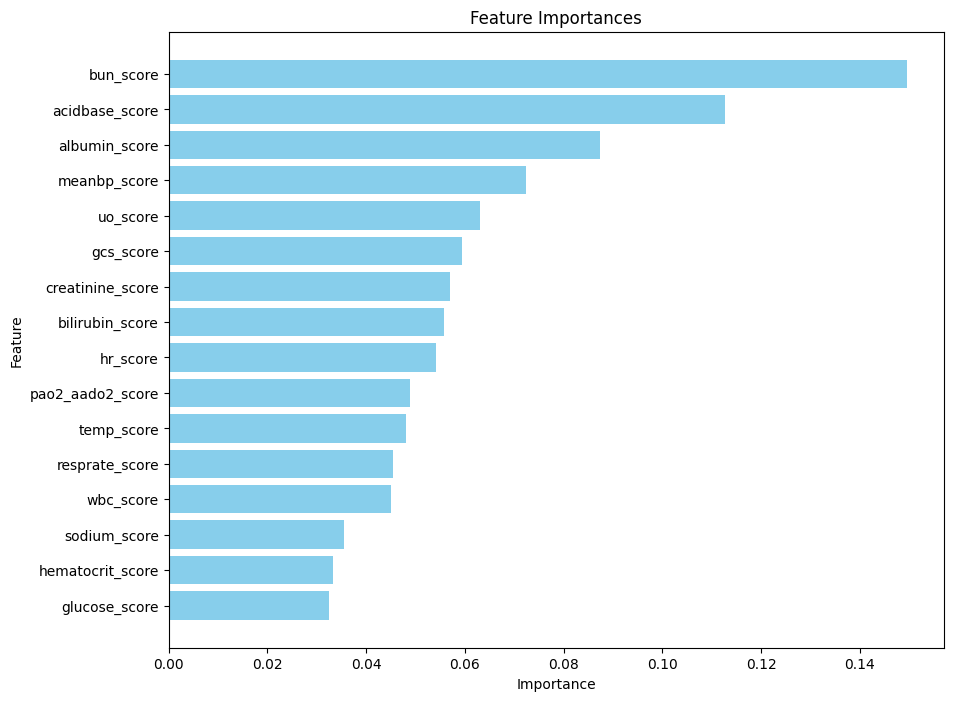

In [31]:
feature_importances_xgb = model_xgb.feature_importances_
feature_names_xgb = X.columns
feature_importance_df_xgb = pd.DataFrame({
    'Feature': feature_names_xgb,
    'Importance': feature_importances_xgb
})

feature_importance_df_xgb = feature_importance_df_xgb.sort_values(by='Importance', ascending=False)


plt.figure(figsize=(10, 8))
plt.barh(feature_importance_df_xgb['Feature'], feature_importance_df_xgb['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importances')
plt.gca().invert_yaxis() 
plt.show()

# 6. Comparison of Scatter Plots of Features Against Models

In [32]:
df_vis = df.copy()

# Replace NaNs with 0
df_filtered_vis = df_vis.fillna(0)

# Separate features and target variable
y_vis = df_filtered_vis['mortality']
X_vis = df_filtered_vis.drop(columns=['mortality'])

# Split the balanced data into training and test sets
X_train_vis, X_test_vis, y_train_vis, y_test_vis = train_test_split(X_vis, y_vis, test_size=0.2, random_state=42, stratify=y_vis)

# Print class distribution after the split
print("Training set class distribution:")
print(y_train_vis.value_counts())

print("Test set class distribution:")
print(y_test_vis.value_counts())

Training set class distribution:
mortality
0    43938
1     5287
Name: count, dtype: int64
Test set class distribution:
mortality
0    10985
1     1322
Name: count, dtype: int64


In [33]:
df_vis_with_preds = X_test_vis.copy()
df_vis_with_preds['APSIII'] = df_vis_with_preds["apsiii_prob"]
df_vis_with_preds['LR'] = results_lr['y_pred_prob']
df_vis_with_preds['EBM'] = results_ebm['y_pred_prob']
df_vis_with_preds['RF'] = results_rf['y_pred_prob']
df_vis_with_preds['XGB'] = results_xgb['y_pred_prob']
df_vis_with_preds = df_vis_with_preds.drop(columns=['apsiii_prob'])
df_vis_with_preds.head()

,subject_id,hadm_id,icustay_id,apsiii,hr_score,meanbp_score,temp_score,resprate_score,pao2_aado2_score,hematocrit_score,...,albumin_score,bilirubin_score,glucose_score,acidbase_score,gcs_score,APSIII,LR,EBM,RF,XGB
33247,3275,164563,253969,19,1.0,4.0,0.0,0.0,9.0,3.0,...,0.0,0.0,0.0,0.0,0.0,0.028248,0.035634,0.034728,0.281582,0.225577
22543,17007,157566,236587,53,5.0,10.0,0.0,11.0,0.0,3.0,...,0.0,0.0,0.0,12.0,0.0,0.126616,0.261488,0.226913,0.665395,0.458434
59106,3101,116894,296030,33,7.0,7.0,0.0,6.0,0.0,3.0,...,0.0,0.0,0.0,0.0,0.0,0.053332,0.047077,0.050198,0.313961,0.144739
22909,5718,178439,237154,19,5.0,4.0,0.0,0.0,0.0,3.0,...,0.0,0.0,3.0,0.0,0.0,0.028248,0.022879,0.024607,0.268461,0.120619
1816,6454,139880,202914,51,0.0,15.0,8.0,0.0,0.0,3.0,...,0.0,0.0,3.0,4.0,0.0,0.116527,0.222645,0.219774,0.675275,0.523334


In [34]:
query = """
SELECT s.*, a.hospital_expire_flag as mortality
FROM apsiii_req_features s
LEFT JOIN admissions a
ON s.subject_id = a.subject_id
AND s.hadm_id = a.hadm_id;
"""

features_df  = execute_query(query)

In [38]:
features_df.columns

Index(['subject_id', 'hadm_id', 'icustay_id', 'heartrate_min', 'heartrate_max',
       'meanbp_min', 'meanbp_max', 'tempc_min', 'tempc_max', 'resprate_min',
       'resprate_max', 'pao2', 'aado2', 'ph', 'paco2', 'hematocrit_min',
       'hematocrit_max', 'wbc_min', 'wbc_max', 'creatinine_min',
       'creatinine_max', 'bun_min', 'bun_max', 'sodium_min', 'sodium_max',
       'albumin_min', 'albumin_max', 'bilirubin_min', 'bilirubin_max',
       'glucose_max', 'glucose_min', 'urineoutput', 'mingcs', 'gcsmotor',
       'gcsverbal', 'gcseyes', 'endotrachflag', 'mortality'],
      dtype='object')

In [37]:
def process_continuous_features(df: pd.DataFrame) -> pd.DataFrame:
    # Average the min and max values for selected features
    df['heartrate'] = (df['heartrate_max'] + df['heartrate_min']) / 2
    df['meanbp'] = (df['meanbp_max'] + df['meanbp_min']) / 2
    df['tempc'] = (df['tempc_max'] + df['tempc_min']) / 2
    df['resprate'] = (df['resprate_max'] + df['resprate_min']) / 2
    df['hematocrit'] = (df['hematocrit_max'] + df['hematocrit_min']) / 2
    df['wbc'] = (df['wbc_max'] + df['wbc_min']) / 2
    df['creatinine'] = (df['creatinine_max'] + df['creatinine_min']) / 2
    df['bun'] = (df['bun_max'] + df['bun_min']) / 2
    df['sodium'] = (df['sodium_max'] + df['sodium_min']) / 2
    df['albumin'] = (df['albumin_max'] + df['albumin_min']) / 2
    df['bilirubin'] = (df['bilirubin_max'] + df['bilirubin_min']) / 2
    df['glucose'] = (df['glucose_max'] + df['glucose_min']) / 2

    # Rename columns where appropriate for clarity or consistency
    df.rename(columns={
        'pao2': 'pao2',
        'aado2': 'aado2',
        'ph': 'ph',
        'paco2': 'paco2',
        'urineoutput': 'urine_output',
        'mingcs': 'min_gcs',
        'gcsmotor': 'gcs_motor',
        'gcsverbal': 'gcs_verbal',
        'gcseyes': 'gcs_eyes',
        'endotrachflag': 'endotracheal_flag'
    }, inplace=True)

    # Drop min/max columns after averaging
    df.drop(columns=[
        'heartrate_max', 'heartrate_min', 'meanbp_max', 'meanbp_min', 
        'tempc_max', 'tempc_min', 'resprate_max', 'resprate_min',
        'hematocrit_max', 'hematocrit_min', 'wbc_max', 'wbc_min',
        'creatinine_max', 'creatinine_min', 'bun_max', 'bun_min',
        'sodium_max', 'sodium_min', 'albumin_max', 'albumin_min',
        'bilirubin_max', 'bilirubin_min', 'glucose_max', 'glucose_min'
    ], inplace=True)
    
    return df


In [39]:
features_df = process_continuous_features(features_df)
features_df.head()

,subject_id,hadm_id,icustay_id,pao2,aado2,ph,paco2,urine_output,min_gcs,gcs_motor,...,tempc,resprate,hematocrit,wbc,creatinine,bun,sodium,albumin,bilirubin,glucose
0,55973,152234,200001,114.0,NaN,7.33,49.0,250.0,14.0,6.0,...,37.027778,23.5,24.85,2.85,2.70,83.0,139.0,NaN,0.20,95.0
1,27513,163557,200003,94.0,NaN,7.38,45.0,3652.0,15.0,6.0,...,37.694444,26.5,33.05,29.35,0.85,20.0,142.0,2.8,3.65,130.0
2,10950,189514,200006,NaN,NaN,NaN,NaN,1955.0,15.0,6.0,...,36.916667,20.5,30.35,9.40,0.95,13.5,136.0,NaN,NaN,148.5
3,20707,129310,200007,NaN,NaN,NaN,NaN,1295.0,15.0,6.0,...,36.999999,21.0,41.25,9.55,0.85,10.5,137.5,4.0,NaN,187.0
4,29904,129607,200009,496.0,NaN,7.51,35.0,1570.0,15.0,6.0,...,36.449999,17.5,29.00,12.40,0.50,15.5,139.0,NaN,NaN,131.5


In [40]:
# Replace NaNs with 0
#features_df = features_df.fillna(0)

# Separate features and target variable
y_f = features_df['mortality']
X_features_df = features_df.drop(columns=['mortality'])

# Split the balanced data into training and test sets
X_train_features_df, X_test_features_df, y_train_f, y_test_f = train_test_split(X_features_df, y_f, test_size=0.2, random_state=42, stratify=y_f)

In [52]:
X_test_features_df.columns

Index(['subject_id', 'hadm_id', 'icustay_id', 'pao2', 'aado2', 'ph', 'paco2',
       'urine_output', 'min_gcs', 'gcs_motor', 'gcs_verbal', 'gcs_eyes',
       'endotracheal_flag', 'heartrate', 'meanbp', 'tempc', 'resprate',
       'hematocrit', 'wbc', 'creatinine', 'bun', 'sodium', 'albumin',
       'bilirubin', 'glucose'],
      dtype='object')

In [50]:
df_vis_with_preds.columns

Index(['subject_id', 'hadm_id', 'icustay_id', 'apsiii', 'hr_score',
       'meanbp_score', 'temp_score', 'resprate_score', 'pao2_aado2_score',
       'hematocrit_score', 'wbc_score', 'creatinine_score', 'uo_score',
       'bun_score', 'sodium_score', 'albumin_score', 'bilirubin_score',
       'glucose_score', 'acidbase_score', 'gcs_score', 'APSIII', 'LR', 'EBM',
       'RF', 'XGB'],
      dtype='object')

In [60]:
# Step 3: Combine with Log-Odds DataFrame
combined_df = X_test_features_df[['subject_id', 'hadm_id', 'icustay_id', 'heartrate', 'meanbp', 
                           'tempc', 'resprate', 'pao2', 'aado2', 'hematocrit', 'wbc', 'creatinine', 'bun', 
                            'urine_output', 'sodium', 'albumin',
                            'bilirubin', 'glucose', 'ph', 'paco2']]

combined_df = combined_df.merge(
    df_vis_with_preds[['subject_id', 'hadm_id', 'icustay_id','gcs_score', 'APSIII', 'LR', 'EBM', 'RF', 'XGB']],
    on=['subject_id', 'hadm_id', 'icustay_id'],
    how='left'
)

combined_df.head()

,subject_id,hadm_id,icustay_id,heartrate,meanbp,tempc,resprate,pao2,aado2,hematocrit,...,bilirubin,glucose,ph,paco2,gcs_score,APSIII,LR,EBM,RF,XGB
0,3275,164563,253969,84.0,91.500000,37.055556,18.0,NaN,279.0,33.55,...,NaN,124.5,7.41,39.0,0.0,0.028248,0.035634,0.034728,0.281582,0.225577
1,17007,157566,236587,83.0,107.000000,37.166665,26.5,NaN,NaN,36.40,...,0.4,129.5,7.45,48.0,0.0,0.126616,0.261488,0.226913,0.665395,0.458434
2,3101,116894,296030,123.5,107.833351,38.111112,20.0,NaN,NaN,31.40,...,0.4,90.0,NaN,NaN,0.0,0.053332,0.047077,0.050198,0.313961,0.144739
3,5718,178439,237154,64.0,92.999851,37.722221,19.5,132.0,NaN,31.50,...,0.3,170.5,7.46,33.0,0.0,0.028248,0.022879,0.024607,0.268461,0.120619
4,6454,139880,202914,78.5,79.500000,35.650000,16.0,133.0,NaN,28.50,...,NaN,214.0,7.17,70.0,0.0,0.116527,0.222645,0.219774,0.675275,0.523334


In [61]:
# Plot continuous feature relationships with log-odds or probabilities, with a 6-column layout
def plot_feature_vs_logodds(df: pd.DataFrame, feature_name: str, logodds_columns: list):
    plt.figure(figsize=(20, 5))  # Wider figure for horizontal layout
    for i, col in enumerate(logodds_columns, start=1):
        plt.subplot(1, 6, i)  # 1 row, 6 columns
        sns.scatterplot(x=df[feature_name], y=df[col], alpha=0.3, label=col)
        plt.title(f"{feature_name} vs {col}")
        plt.xlabel(feature_name)
        plt.ylabel("Log-Odds or Probability")

    # Histogram in the last subplot (6th column)
    plt.subplot(1, 6, len(logodds_columns) + 1)
    sns.histplot(df[feature_name].dropna(), kde=True, color='blue', alpha=0.4)  # Exclude NaNs from histogram
    plt.title(f"Histogram of {feature_name} (excluding NaNs)")
    
    plt.tight_layout()
    plt.show()

# Plot categorical feature relationships with log-odds or probabilities, with a 6-column layout
def plot_categorical_vs_logodds(df: pd.DataFrame, feature_name: str, logodds_columns: list):
    plt.figure(figsize=(20, 5))  # Wider figure for horizontal layout
    for i, col in enumerate(logodds_columns, start=1):
        plt.subplot(1, 6, i)  # 1 row, 6 columns
        sns.boxplot(x=df[feature_name], y=df[col])
        plt.title(f"{feature_name} vs {col}")
        plt.xlabel(feature_name)
        plt.ylabel("Log-Odds or Probability")

    plt.tight_layout()
    plt.show()


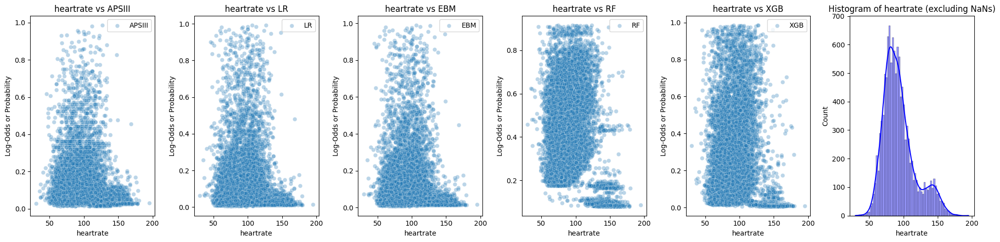

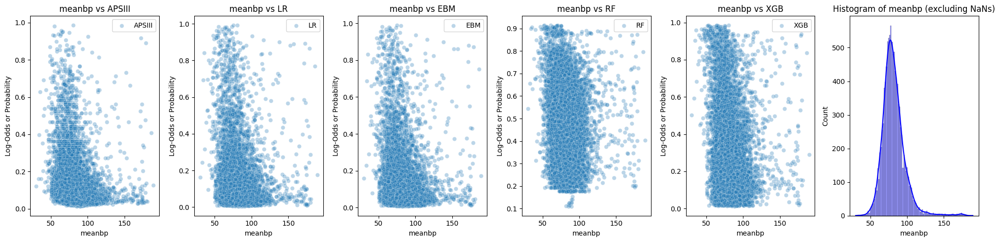

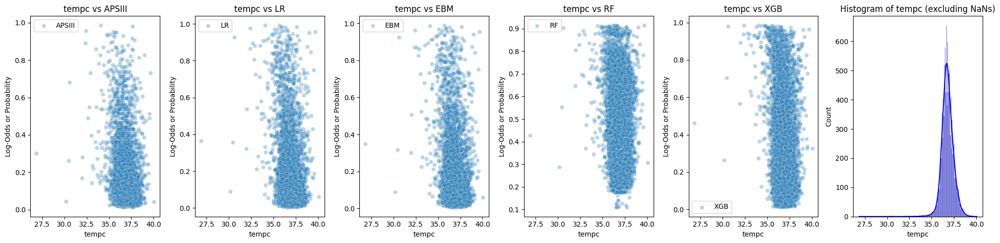

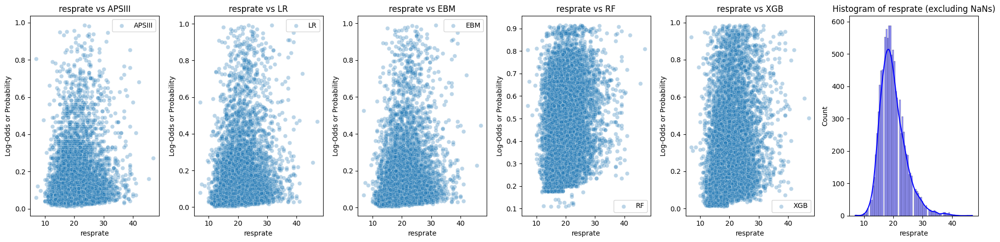

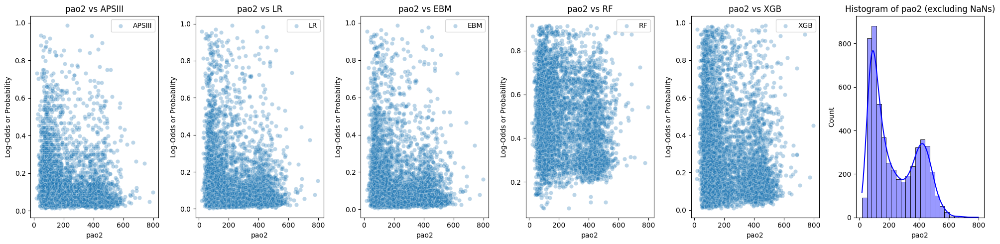

...

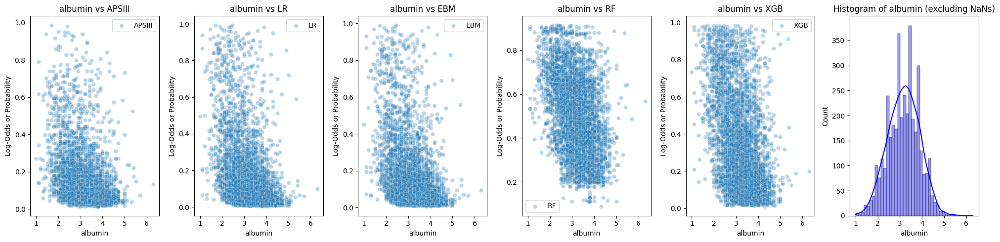

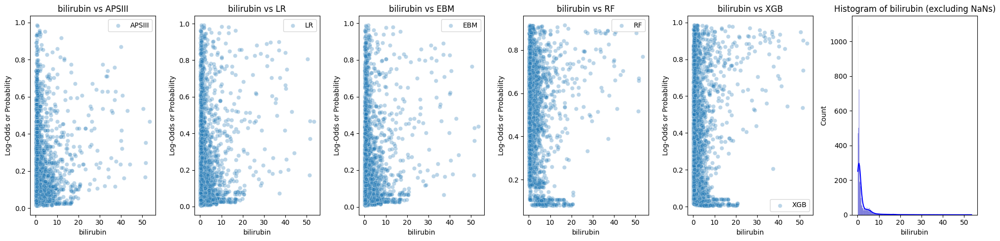

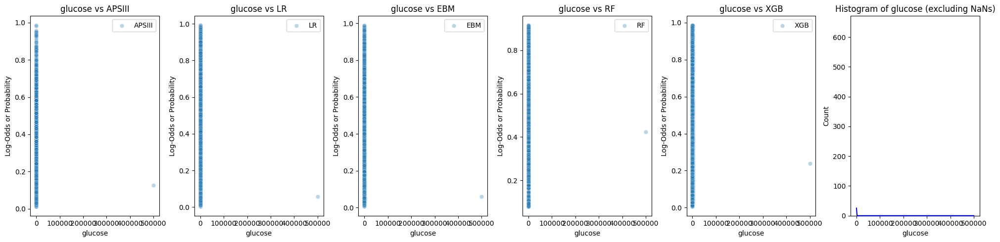

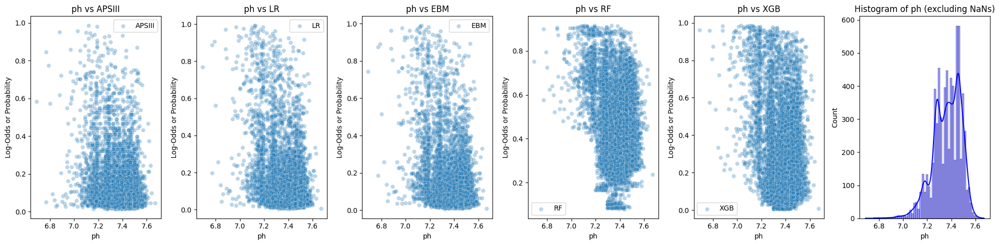

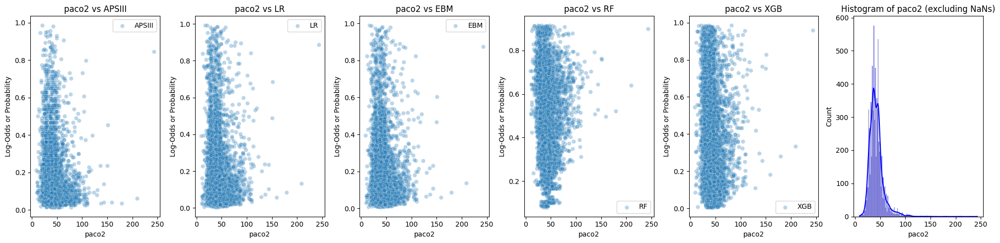

In [64]:
# Step 4: Plot Continuous Feature Relationships
continuous_features = ['heartrate', 'meanbp', 
                        'tempc', 'resprate', 'pao2', 'aado2', 'hematocrit', 'wbc', 'creatinine', 'bun', 
                        'urine_output', 'sodium', 'albumin',
                        'bilirubin', 'glucose', 'ph', 'paco2']
logodds_columns = ['APSIII', 'LR', 'EBM', 'RF', 'XGB']

for feature in continuous_features:
    plot_feature_vs_logodds(combined_df, feature, logodds_columns)


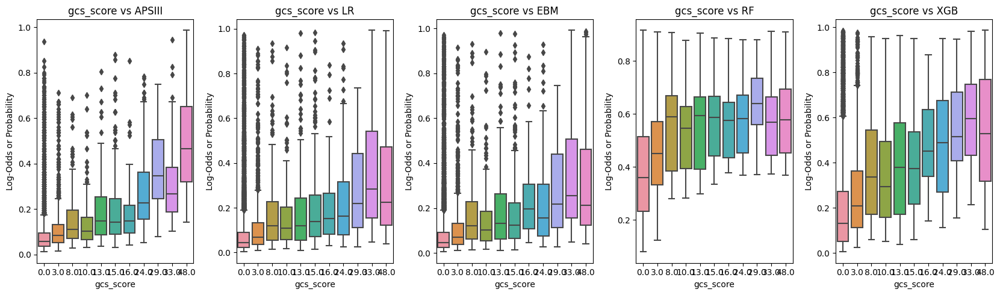

In [65]:
# Step 5: Plot Categorical Feature Relationships
plot_categorical_vs_logodds(combined_df,'gcs_score', logodds_columns)

# 7. SHAP Values of the Models

## 7.1 LogisticGam SHAP Plost

  0%|          | 0/3000 [00:00<?, ?it/s]

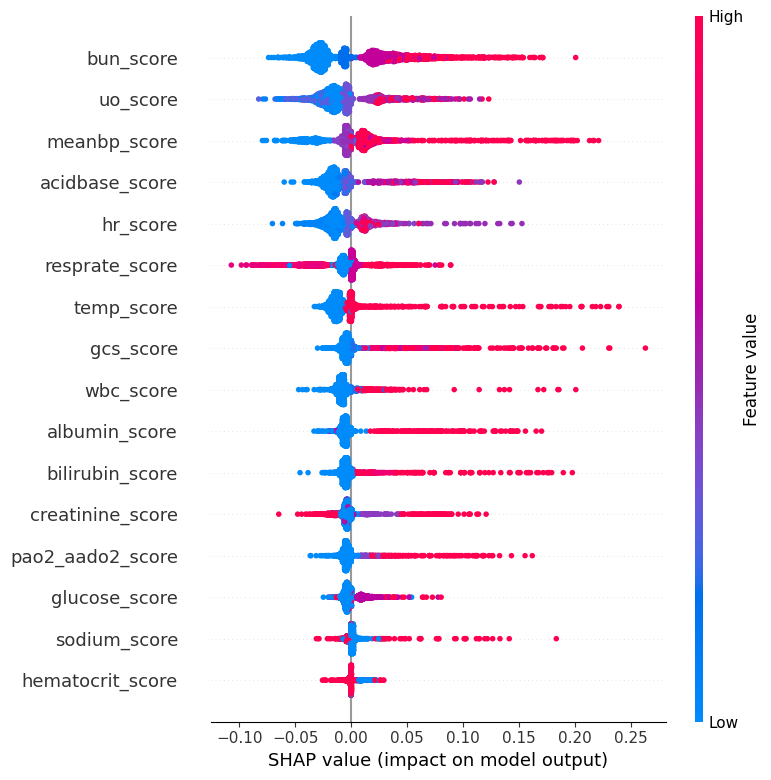

In [68]:
def stratified_shap_sample(X, y, sample_size=50, columns=None, random_state=42):
    """Perform stratified sampling with shap.sample while preserving class distribution."""
    # Combine X and y into a DataFrame for easier sampling
    combined_data = pd.DataFrame(X, columns=columns)
    combined_data['target'] = y

    # Perform stratified sampling manually to maintain class proportions
    stratified_data = combined_data.groupby('target', group_keys=False).apply(
        lambda x: x.sample(min(len(x), sample_size // len(combined_data['target'].unique())), random_state=random_state)
    )
    
    return stratified_data.drop(columns='target').values  # Drop the target column for background data

# Assuming X_train_scaled is a NumPy array and we have the column names in X.columns
background_data_lr = stratified_shap_sample(X_train_scaled, y_train, sample_size=50, columns=X.columns)

# Function to predict probabilities using the trained LogisticGAM model
def predict_gam_proba(X):
    return model_lr.predict_proba(X)

# Use the KernelExplainer for SHAP values with stratified background data
explainer_lr = shap.KernelExplainer(predict_gam_proba, background_data_lr)

# Example: Selecting a random subset of X_test_scaled using NumPy
subset_size = 3000  # Choose an appropriate subset size based on your data
subset_indices = np.random.choice(X_test_scaled.shape[0], size=subset_size, replace=False)
X_test_subset = X_test_scaled[subset_indices]

# Compute SHAP values using the subset
shap_values_lr = explainer_lr.shap_values(X_test_subset, nsamples=50)


# Plot SHAP summary plot
shap.summary_plot(shap_values_lr, X_test_subset, feature_names=X.columns)


In [69]:
# Initialize JavaScript for SHAP visualizations
shap.initjs()
# Plot force plot for the first instance in X_test_subset
shap.force_plot(explainer_lr.expected_value, shap_values_lr[0], X_test_subset[0], feature_names=X.columns)


In [70]:
# Step 1: Define a probability prediction function for model_lr
def predict_lr_proba(X):
    """Wrap the model's prediction to return probabilities for both classes."""
    # Assuming model_lr returns a probability of the positive class (class 1)
    # Let's use that to generate a probability distribution for LIME
    
    class_1_probs = model_lr.predict_proba(X)  # Get probability of class 1 directly if available
    
    # Check if only one column of probabilities is returned (for the positive class)
    if class_1_probs.ndim == 1 or class_1_probs.shape[1] == 1:
        class_1_probs = class_1_probs.flatten()  # Ensure it's a 1D array
        class_0_probs = 1 - class_1_probs  # Calculate class 0 probabilities
        return np.column_stack((class_0_probs, class_1_probs))  # Stack them into a 2D array
    return class_1_probs  # Otherwise, assume probabilities for both classes are returned

# Step 2: Initialize the LIME Tabular Explainer for Logistic Regression model
explainer_lr = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_scaled,            # Scaled training data
    feature_names=X.columns,                # Feature names from your original DataFrame
    class_names=['Negative', 'Positive'],   # Class names for binary classification (adjust if needed)
    mode='classification'                   # Since this is a classification problem
)

# Step 3: Choose an instance from your test set to explain
instance_to_explain_lr = X_test_scaled[1].reshape(1, -1)

# Step 4: Generate an explanation for the chosen instance
explanation_lr = explainer_lr.explain_instance(
    data_row=instance_to_explain_lr.flatten(),   # The specific instance to explain
    predict_fn=predict_lr_proba                  # Custom probability prediction function
)

# Step 5: Visualize the explanation in a notebook or save it as HTML
explanation_lr.show_in_notebook(show_table=True)  # For Jupyter notebooks

# Or save the explanation to an HTML file for viewing in a browser
explanation_lr.save_to_file("lime_explanation_lr.html")


[ 1.78760055e-04  2.93329000e-03  5.60656537e-04  3.16892825e-04
 -1.54383684e-04  8.93800276e-05 -7.31291135e-04  7.47542049e-04
  1.53571138e-03  1.12131307e-03  2.43763712e-05 -1.30007313e-04
  1.60071504e-03 -2.92516454e-04  2.27512798e-04  1.32444950e-03]


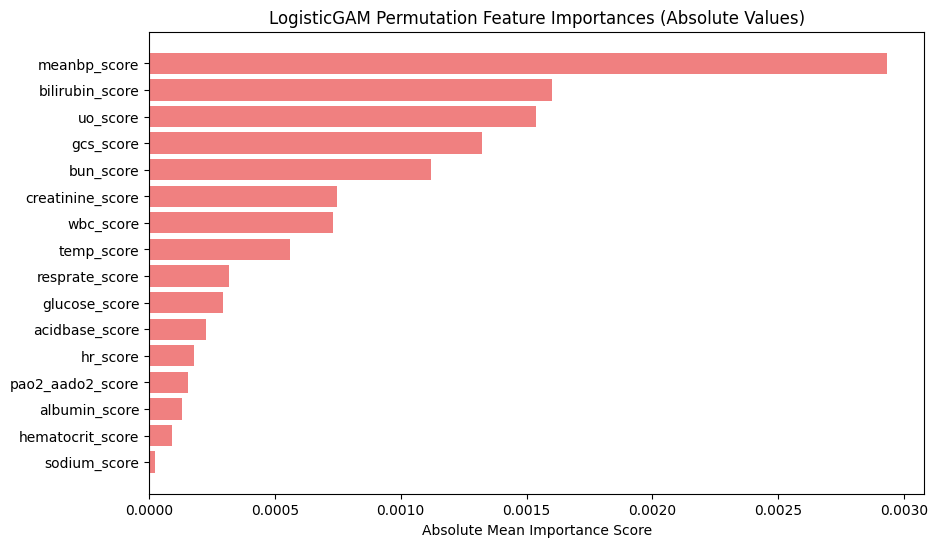

In [84]:
# Permutation Importance for model_lr (Logistic Regression)
results_lr = permutation_importance(model_lr, X_test_scaled, y_test, n_repeats=10, random_state=42)
importances_lr = results_lr.importances_mean
print(importances_lr)

# Use absolute values of the importances for plotting
abs_importances_lr = np.abs(importances_lr)

# Sort feature importances based on absolute values in descending order
sorted_idx_lr = np.argsort(abs_importances_lr)[::-1]

# Plot the feature importances using absolute values
plt.figure(figsize=(10, 6))
plt.barh(np.array(feature_names)[sorted_idx_lr], abs_importances_lr[sorted_idx_lr], color='lightcoral')
plt.xlabel("Absolute Mean Importance Score")
plt.title("LogisticGAM Permutation Feature Importances (Absolute Values)")
plt.gca().invert_yaxis()  # Invert y-axis to display the most important feature at the top
plt.show()


## 7.2. EBM SHAP Plots

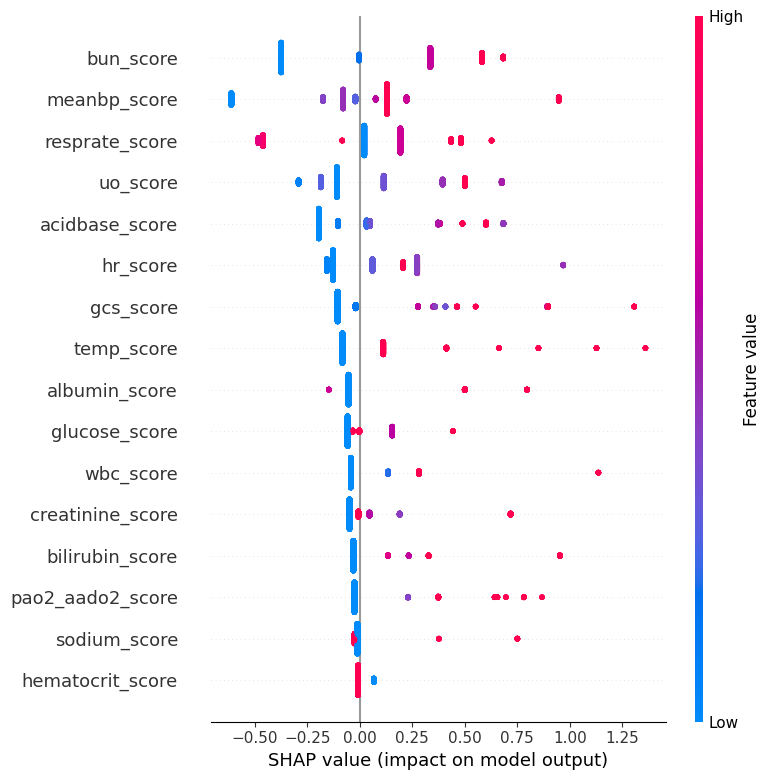

  0%|          | 0/3000 [00:00<?, ?it/s]

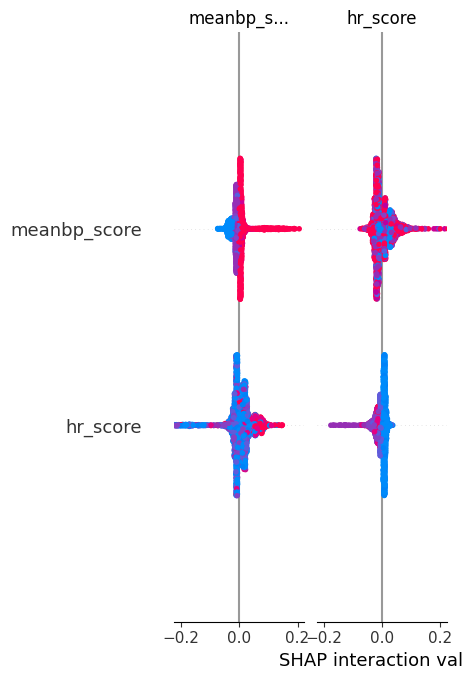

In [85]:
# Step 1: Define the prediction function for SHAP
def predict_ebm_proba(X):
    """Returns predicted probabilities using the trained EBM model."""
    return model_ebm.predict_proba(X)

# Step 2: Take a subset of X_test_scaled
# Assuming X_test_scaled is a NumPy array and X is the original DataFrame with column names
subset_size = 3000  # Choose an appropriate subset size based on your data

# Convert X_test_scaled to a DataFrame to perform sampling
X_test_df = pd.DataFrame(X_test_scaled, columns=X.columns)

# Select a random subset
X_test_subset = X_test_df.sample(n=subset_size, random_state=42).values  # Convert back to NumPy array

# Step 3: Use the SHAP AdditiveExplainer for EBM without interactions
explainer_ebm = shap.Explainer(model_ebm, X_train_scaled)  # Automatically selects AdditiveExplainer

# Step 4: Compute SHAP values for the subset of test data
shap_values_ebm = explainer_ebm(X_test_subset)

# Step 5: Plot SHAP values using a summary plot (beeswarm plot)
shap.summary_plot(shap_values_ebm, X_test_subset, plot_type="dot", feature_names=X.columns)

X_test_df = pd.DataFrame(X_test_scaled, columns=X.columns)

# Select a random subset
X_test_subset = X_test_df.sample(n=subset_size, random_state=42).values  # Convert back to NumPy array

# Step 3: Use KernelExplainer for SHAP values with a representative background data
background_data_ebm = shap.sample(X_train_scaled, 50)  # Use 50 samples from training data for background
explainer_ebm = shap.KernelExplainer(predict_ebm_proba, background_data_ebm)

# Step 4: Compute SHAP values for the subset of test data
shap_values_ebm = explainer_ebm.shap_values(X_test_subset, nsamples=50)  # Adjust nsamples as needed

# Step 5: Plot SHAP values using a summary plot (beeswarm plot)
shap.summary_plot(shap_values_ebm, X_test_subset, plot_type="dot", feature_names=X.columns)


In [86]:
# Step 1: Initialize the LIME Tabular Explainer for EBM
explainer_ebm = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_scaled,            # Scaled training data
    feature_names=X.columns,                # Feature names from your original DataFrame
    class_names=['Negative', 'Positive'],   # Class names for binary classification (adjust if needed)
    mode='classification'                   # Since this is a classification problem
)

# Step 2: Choose an instance from your test set to explain
instance_to_explain_ebm = X_test_scaled[1].reshape(1, -1)

# Step 3: Generate an explanation for the chosen instance
explanation_ebm = explainer_ebm.explain_instance(
    data_row=instance_to_explain_ebm.flatten(),   # The specific instance to explain
    predict_fn=model_ebm.predict_proba            # Prediction function (model’s probability predictions)
)

# Step 4: Visualize the explanation in a notebook or save it as HTML
explanation_ebm.show_in_notebook(show_table=True)  # For Jupyter notebooks

# Or save the explanation to an HTML file for viewing in a browser
explanation_ebm.save_to_file("lime_explanation_ebm.html")


Permutation Importances for EBM model: [-8.12545706e-05  2.24262615e-03  1.86885512e-04 -4.22523767e-04
 -1.78760055e-04 -3.25018282e-05 -7.47542049e-04  4.14398310e-04
  8.77549362e-04  6.90663850e-04 -1.62509141e-04 -3.81896482e-04
  1.43008044e-03 -5.76907451e-04  3.16892825e-04  8.28796620e-04]


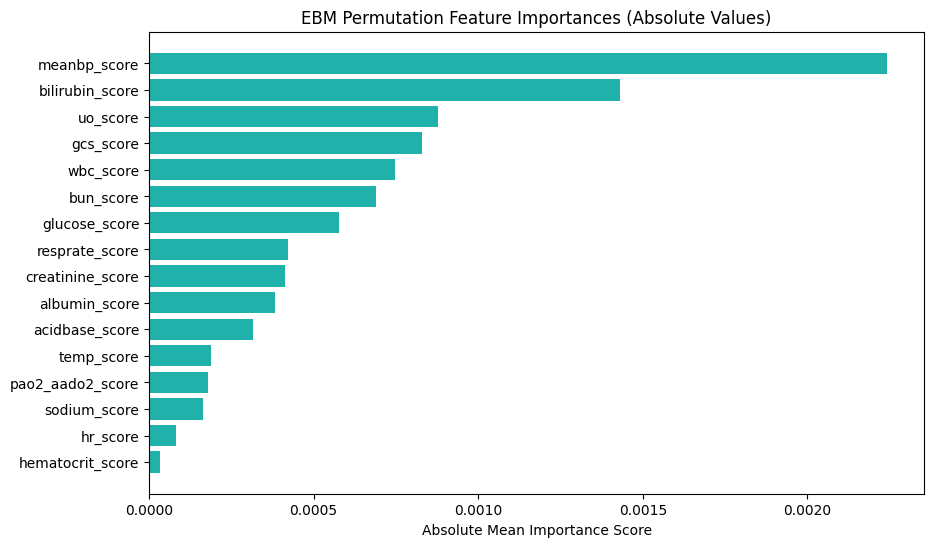

In [87]:
# Calculate Permutation Importance for model_ebm (Explainable Boosting Machine)
results_ebm = permutation_importance(model_ebm, X_test_scaled, y_test, n_repeats=10, random_state=42)
importances_ebm = results_ebm.importances_mean
print("Permutation Importances for EBM model:", importances_ebm)

# Use absolute values of the importances for plotting
abs_importances_ebm = np.abs(importances_ebm)

# Sort feature importances based on absolute values in descending order
sorted_idx_ebm = np.argsort(abs_importances_ebm)[::-1]

# Plot the feature importances using absolute values
plt.figure(figsize=(10, 6))
plt.barh(np.array(feature_names)[sorted_idx_ebm], abs_importances_ebm[sorted_idx_ebm], color='lightseagreen')
plt.xlabel("Absolute Mean Importance Score")
plt.title("EBM Permutation Feature Importances (Absolute Values)")
plt.gca().invert_yaxis()  # Invert y-axis to display the most important feature at the top
plt.show()

## 7.3. Random Forest SHAP Values

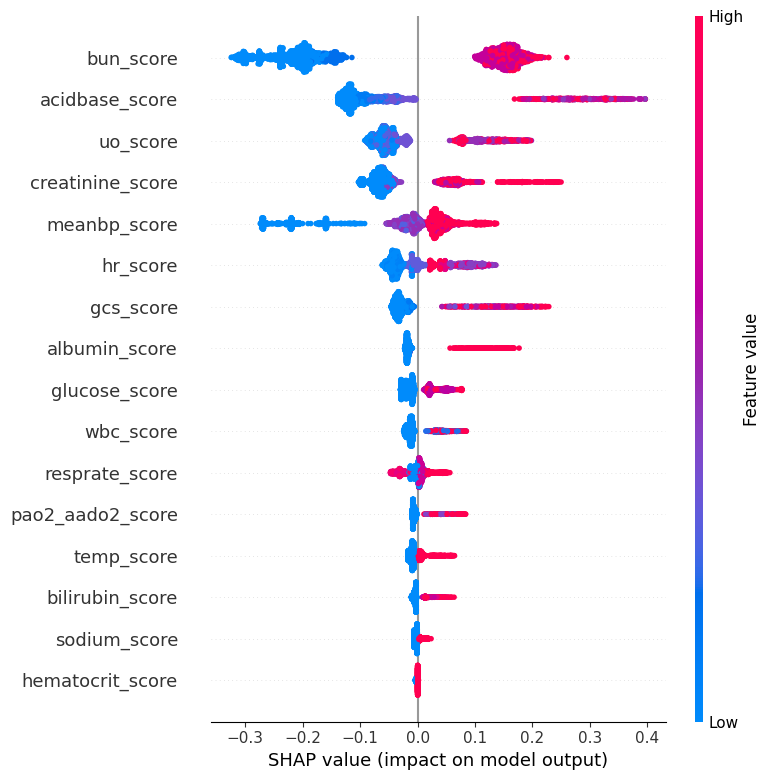

In [88]:
# Step 1: Take a subset of X_test_scaled
subset_size = 3000  # Choose an appropriate subset size based on your data

# Convert X_test_scaled to a DataFrame to perform sampling
X_test_df = pd.DataFrame(X_test_scaled, columns=X.columns)

# Select a random subset
X_test_subset = X_test_df.sample(n=subset_size, random_state=42).values  # Convert back to NumPy array

# Step 2: Initialize the SHAP TreeExplainer for the Random Forest model
explainer_rf = shap.TreeExplainer(model_rf)

# Step 3: Compute SHAP values for the subset of test data
shap_values_rf = explainer_rf.shap_values(X_test_subset)

# Step 4: Extract SHAP values for each class separately
shap_values_class_0 = shap_values_rf[:, :, 0]  
shap_values_class_1 = shap_values_rf[:, :, 1]  

shap_values_combined = shap_values_class_1 - shap_values_class_0


# Step 5: Plot SHAP values using a summary plot (beeswarm plot) for class 1
shap.summary_plot(shap_values_combined, X_test_subset, plot_type="dot", feature_names=X.columns)

In [89]:
# Ensure that JavaScript is initialized for SHAP visualizations
shap.initjs()

# Plot force plot for the first instance in X_test_subset for class 1
shap.force_plot(
    explainer_rf.expected_value[1],       # The base value for class 1
    shap_values_combined[0],               # SHAP values for the first instance for class 1
    X_test_subset[0],                     # Feature values for the first instance
    feature_names=X.columns               # Names of the features
)


In [90]:
# Step 1: Initialize the LIME Tabular Explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_scaled,            # Scaled training data
    feature_names=X.columns,                # Feature names from your original DataFrame
    class_names=['Negative', 'Positive'],   # Class names for binary classification (adjust if needed)
    mode='classification'                   # Since this is a classification problem
)

# Step 2: Choose an instance from your test set to explain
instance_to_explain = X_test_scaled[1].reshape(1, -1)

# Step 3: Generate an explanation for the chosen instance
explanation = explainer.explain_instance(
    data_row=instance_to_explain.flatten(),   # The specific instance to explain
    predict_fn=model_rf.predict_proba         # Prediction function (model’s probability predictions)
)

# Step 4: Visualize the explanation in a notebook or save it as HTML
explanation.show_in_notebook(show_table=True)  # For Jupyter notebooks

# Or save the explanation to an HTML file for viewing in a browser
explanation.save_to_file("lime_explanation_rf.html")


Permutation Importances for Random Forest model: [ 2.10043065e-02 -6.14284554e-03  6.50036565e-05  2.22637523e-03
 -1.21881856e-04  6.50036565e-05  2.93329000e-03  3.37206468e-03
  1.43333062e-02  4.87527423e-04  3.25018282e-04  3.63207930e-03
  3.11205005e-03 -1.47070773e-03  1.72665962e-02  4.43649955e-03]


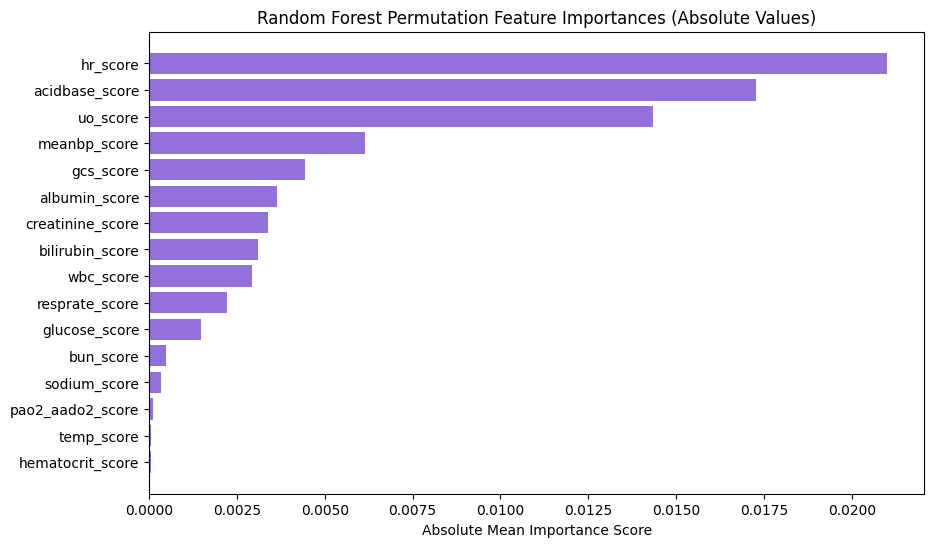

In [91]:
# Calculate Permutation Importance for model_rf (Random Forest)
results_rf = permutation_importance(model_rf, X_test_scaled, y_test, n_repeats=10, random_state=42)
importances_rf = results_rf.importances_mean
print("Permutation Importances for Random Forest model:", importances_rf)

# Use absolute values of the importances for plotting
abs_importances_rf = np.abs(importances_rf)

# Sort feature importances based on absolute values in descending order
sorted_idx_rf = np.argsort(abs_importances_rf)[::-1]

# Plot the feature importances using absolute values
plt.figure(figsize=(10, 6))
plt.barh(np.array(feature_names)[sorted_idx_rf], abs_importances_rf[sorted_idx_rf], color='mediumpurple')
plt.xlabel("Absolute Mean Importance Score")
plt.title("Random Forest Permutation Feature Importances (Absolute Values)")
plt.gca().invert_yaxis()  # Invert y-axis to display the most important feature at the top
plt.show()

## 7.4. XGBoost SHAP Plots

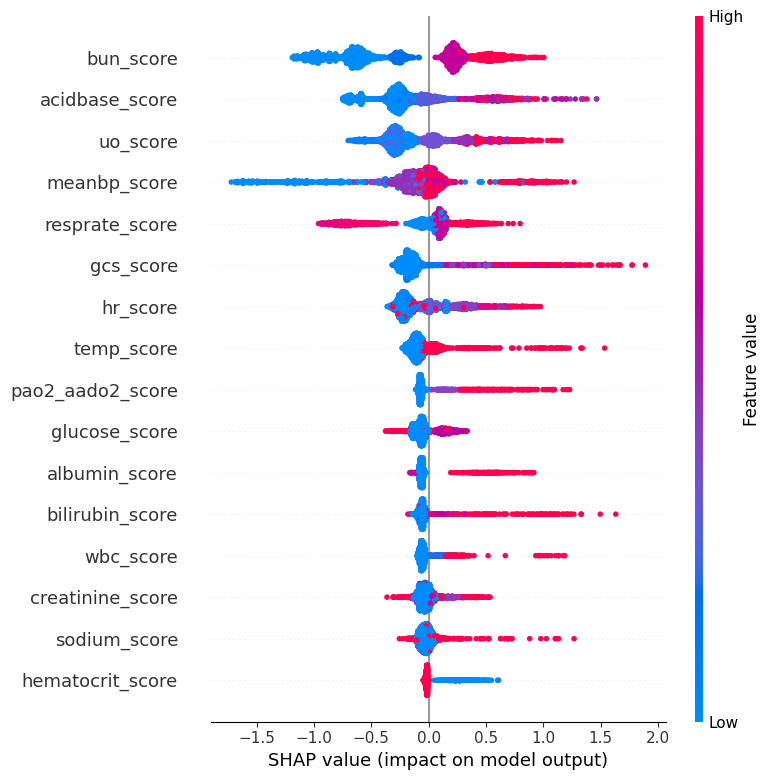

In [92]:
# Step 1: Take a subset of X_test_scaled
subset_size = 3000  # Choose an appropriate subset size based on your data

# Convert X_test_scaled to a DataFrame to perform sampling
X_test_df = pd.DataFrame(X_test_scaled, columns=X.columns)

# Select a random subset
X_test_subset = X_test_df.sample(n=subset_size, random_state=42).values  # Convert back to NumPy array

# Step 2: Initialize the SHAP TreeExplainer for the XGBoost model
explainer_xgb = shap.TreeExplainer(model_xgb)

# Step 3: Compute SHAP values for the subset of test data
shap_values_xgb = explainer_xgb.shap_values(X_test_subset)


# Step 4: Plot SHAP values using a summary plot (beeswarm plot) for the combined effect
shap.summary_plot(shap_values_xgb, X_test_subset, plot_type="dot", feature_names=X.columns)


In [93]:
# Ensure that JavaScript is initialized for SHAP visualizations
shap.initjs()

# Plot force plot for the first instance in X_test_subset for class 1
shap.force_plot(
    explainer_xgb.expected_value,  # The base value for class 1
    shap_values_xgb[0],           # SHAP values for the first instance for class 1
    X_test_subset[0],                 # Feature values for the first instance
    feature_names=X.columns           # Names of the features
)


In [94]:
# Step 1: Initialize the LIME Tabular Explainer for XGBoost model
explainer_xgb = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_scaled,            # Scaled training data
    feature_names=X.columns,                # Feature names from your original DataFrame
    class_names=['Negative', 'Positive'],   # Class names for binary classification (adjust if needed)
    mode='classification'                   # Since this is a classification problem
)

# Step 2: Choose an instance from your test set to explain
instance_to_explain_xgb = X_test_scaled[1].reshape(1, -1)

# Step 3: Generate an explanation for the chosen instance
explanation_xgb = explainer_xgb.explain_instance(
    data_row=instance_to_explain_xgb.flatten(),   # The specific instance to explain
    predict_fn=model_xgb.predict_proba            # Prediction function (model’s probability predictions)
)

# Step 4: Visualize the explanation in a notebook or save it as HTML
explanation_xgb.show_in_notebook(show_table=True)  # For Jupyter notebooks

# Or save the explanation to an HTML file for viewing in a browser
explanation_xgb.save_to_file("lime_explanation_xgb.html")


Permutation Importances for XGBoost model: [ 0.00732104  0.01488584 -0.00013001 -0.00161697 -0.0016901   0.00282766
 -0.00029252  0.00428212  0.008938   -0.00021126  0.00270578 -0.00098318
  0.00442025  0.00080442  0.00058503  0.00366458]


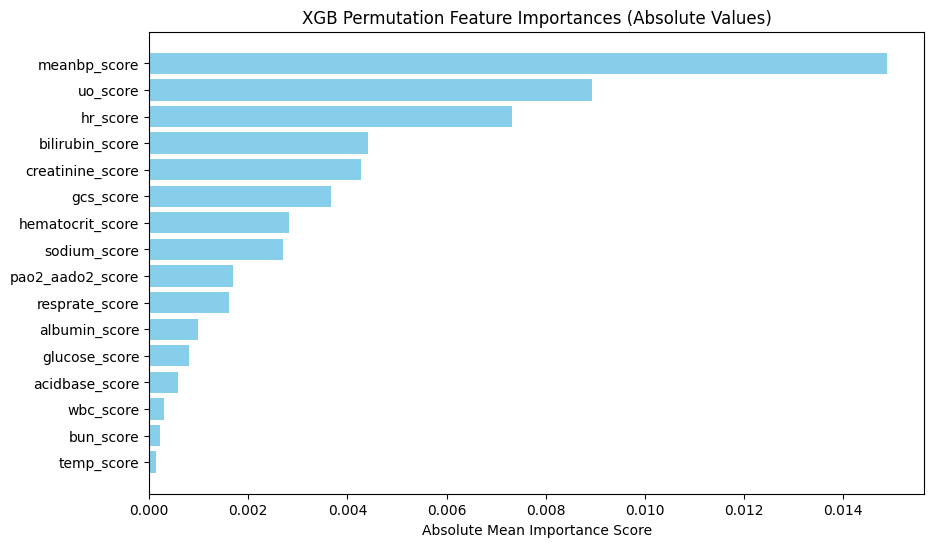

In [95]:
# Step 1: Calculate Permutation Importance for model_xgb (XGBoost)
results_xgb = permutation_importance(model_xgb, X_test_scaled, y_test, n_repeats=10, random_state=42)
importances_xgb = results_xgb.importances_mean
print("Permutation Importances for XGBoost model:", importances_xgb)

# Step 2: Use absolute values of the importances for plotting
abs_importances_xgb = np.abs(importances_xgb)

# Step 3: Sort feature importances based on absolute values in descending order
sorted_idx_xgb = np.argsort(abs_importances_xgb)[::-1]

# Step 4: Plot the feature importances using absolute values
plt.figure(figsize=(10, 6))
plt.barh(np.array(feature_names)[sorted_idx_xgb], abs_importances_xgb[sorted_idx_xgb], color='skyblue')
plt.xlabel("Absolute Mean Importance Score")
plt.title("XGB Permutation Feature Importances (Absolute Values)")
plt.gca().invert_yaxis()  # Invert y-axis to display the most important feature at the top
plt.show()

# Thanks